In [9]:
import pandas as pd
import numpy as np
from scipy.spatial.transform import Rotation as R
import plotly.graph_objects as go


data = pd.read_csv('log/data_sensor_new_squareXTheta.csv')
data.columns

Index(['Time [s]', 'Acceleration X [m/s^2]', 'Acceleration Y [m/s^2]',
       'Acceleration Z [m/s^2]', 'Angular velocity X [rad/s]',
       'Angular velocity Y [rad/s]', 'Angular velocity Z [rad/s]',
       'Quaternion X', 'Quaternion Y', 'Quaternion Z', 'Quaternion W',
       'Velocity X [m/s]', 'Velocity Y [m/s]', 'Height [m]', 'Position X [m]',
       'Position Y [m]'],
      dtype='object')

In [10]:
accelerations = data[['Acceleration X [m/s^2]', 'Acceleration Y [m/s^2]', 'Acceleration Z [m/s^2]']].to_numpy()*9.81
velocities = data[['Velocity X [m/s]', 'Velocity Y [m/s]']].to_numpy()
positions = data[['Position X [m]', 'Position Y [m]']].to_numpy()
heights = data['Height [m]'].to_numpy()
angular_velocity = data[['Angular velocity X [rad/s]', 'Angular velocity Y [rad/s]', 'Angular velocity Z [rad/s]']].to_numpy()
quaternions = data[['Quaternion X', 'Quaternion Y', 'Quaternion Z', 'Quaternion W']].to_numpy()
times = data['Time [s]'].to_numpy()

## Plot X, Y Position from KF

In [3]:
fig = go.Figure()

# Add square reference
fig.add_trace(go.Scatter(x=[0.0, 1.5, 1.5, 0.0, 0.0], y=[0.0, 0.0, 1.5, 1.5, 0.0], mode='lines', name='Reference Square', marker_color='black'))

for k in range(1, 6):
    file_name = 'log/data_sensor_new_squareXY' + str(k) + '.csv'
    data = pd.read_csv(file_name)
    positions = data[['Position X [m]', 'Position Y [m]']].to_numpy()

    fig.add_trace(go.Scatter(x=-positions[:,1], y=positions[:,0], mode='lines', name='Estimated Position', opacity=0.3, marker_color='blue'))

    # If k != 1 remove legend
    if k != 1:
        fig.data[-1].showlegend = False
fig.update_layout(
                  xaxis_title='X [m]',
                  yaxis_title='Y [m]', width=600, height=600, showlegend=True, template='plotly_white')
fig.show()

In [11]:
fig = go.Figure()

# Add square reference
fig.add_trace(go.Scatter(x=[0.0, 1.5, 1.5, 0.0, 0.0], y=[0.0, 0.0, 1.5, 1.5, 0.0], mode='lines', name='Reference Square', marker_color='black'))

file_name = 'log/data_sensor_new_squareXTheta.csv'
data = pd.read_csv(file_name)
positions = data[['Position X [m]', 'Position Y [m]']].to_numpy()

fig.add_trace(go.Scatter(x=-positions[:,1], y=positions[:,0], mode='lines', name='Estimated Position', opacity=0.3, marker_color='blue'))

fig.update_layout(
                  xaxis_title='X [m]',
                  yaxis_title='Y [m]', width=600, height=600, showlegend=True, template='plotly_white')
fig.show()

In [490]:
np.concatenate((np.array([1,2]), [1]))

array([1, 2, 1])

## Plot X, theta Position from KF

In [8]:
# Convert position from local to global frame
def local_to_global(positions_local, quaternions_local):
    theta0 = R.from_quat(quaternions_local[60]).as_euler('zyx')[0]
    positions_global = [np.zeros(2)]
    thetas = [theta0]
    for i in range(1, len(positions_local)):
        theta = R.from_quat(quaternions_local[i]).as_euler('zyx')[0] - theta0
        thetas.append(theta)

        delta_position = positions_local[i] - positions_local[i-1]
        delta_position_global = np.array([np.cos(theta), -np.sin(theta), 
                                        np.sin(theta), np.cos(theta)]).reshape(2, 2) @ delta_position
        
        positions_global.append(positions_global[-1] + delta_position_global)

    return np.array(positions_global), np.array(thetas)

# Plot it
fig = go.Figure()

# Add square reference
fig.add_trace(go.Scatter(x=[0.0, 1.5, 1.5, 0.0, 0.0], y=[0.0, 0.0, 1.5, 1.5, 0.0], mode='lines', name='Reference Square', marker_color='black'))

# for k in range(1, 6):
file_name = 'log/data_sensor_new_squareXTheta' + '.csv'
data = pd.read_csv(file_name)
positions = data[['Position X [m]', 'Position Y [m]']].to_numpy()
quaternions = data[['Quaternion X', 'Quaternion Y', 'Quaternion Z', 'Quaternion W']].to_numpy()
positions_global, thetas = local_to_global(positions, quaternions)

fig.add_trace(go.Scatter(x=-positions_global[:,1], y=positions_global[:,0], mode='lines', name='Estimated Position', opacity=0.3, marker_color='blue'))

    # # If k != 1 remove legend
    # if k != 1:
    #     fig.data[-1].showlegend = False

fig.update_layout(
                    xaxis_title='X [m]',
                    yaxis_title='Y [m]', width=600, height=600, showlegend=True, template='plotly_white')

fig.show()
    

In [472]:
fig = go.Figure(go.Scatter(y=np.rad2deg(thetas), mode='lines', name='Theta')).show()

In [448]:
np.pi

3.141592653589793

In [ ]:
# 1.28

## Most basic: Direct integration without any compensation

In [398]:
est_velocities = [np.array([0, 0])]
est_positions_imu = [np.array([0, 0])]
est_positions_flow = [np.array([0, 0])]

for i in range(1, len(accelerations)):
    dt = times[i] - times[i-1]
    acc = 0.5*(accelerations[i-1][:2]+accelerations[i][:2])
    est_velocities.append(est_velocities[-1] +  acc* dt)
    est_positions_imu.append(est_positions_imu[-1] + 0.5*(est_velocities[-1]+est_velocities[-2]) * dt  + 0.5*acc*dt**2)

    est_positions_flow.append(est_positions_flow[-1] + 0.5*(velocities[i]+velocities[i-1])*dt)

est_velocities = np.stack(est_velocities)
est_positions_imu = np.stack(est_positions_imu)
est_positions_flow = np.stack(est_positions_flow)

In [399]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

fig = make_subplots(rows=2, cols=1)

# fig.add_trace(go.Scatter(x=times, y=accelerations[:, 0], mode='lines', name='Acceleration X'))
fig.add_trace(go.Scatter(x=times, y=velocities[:, 0], mode='lines', name='Velocity X'), row=1, col=1)
fig.add_trace(go.Scatter(x=times, y=velocities[:, 1], mode='lines', name='Velocity Y'), row=1, col=1)
fig.add_trace(go.Scatter(x=times, y=est_positions_flow[:, 0], mode='lines', name='Position X'), row=2, col=1)
fig.add_trace(go.Scatter(x=times, y=est_positions_flow[:, 1], mode='lines', name='Position Y'), row=2, col=1)

fig.update_layout(width=800, height=800)
fig.show()

In [487]:
theta_est = [1.22]
theta_real = []
for i in range(1, len(quaternions)):
    r = R.from_quat(quaternions[i])
    theta_real.append(r.as_euler('zyx')[0])

    theta_est.append(theta_est[-1] + angular_velocity[i][2]*(times[i]-times[i-1]))


fig = go.Figure()
fig.add_trace(go.Scatter(x=times, y=theta_real, mode='lines', name='Real'))
fig.add_trace(go.Scatter(x=times, y=theta_est, mode='lines', name='Estimation'))
fig.show()

In [477]:
quaternions.shape

(10439, 4)

In [400]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

fig = make_subplots(rows=2, cols=1, shared_xaxes=True)

fig.add_trace(go.Scatter(x=velocities[:, 0], y=velocities[:, 1], mode='lines', name='Velocity X [m/s]'), row=1, col=1)
fig.add_trace(go.Scatter(x=est_velocities[:, 0], y=est_velocities[:, 1], mode='lines', name='Estimated Velocity X [m/s]'), row=1, col=1)

fig.add_trace(go.Scatter(x=est_positions_imu[:, 0], y=est_positions_imu[:, 1], mode='lines', name='Velocity Y [m/s]'), row=2, col=1)
fig.add_trace(go.Scatter(x=est_positions_flow[:, 0], y=est_positions_flow[:, 1], mode='lines', name='Estimated Velocity Y [m/s]'), row=2, col=1)

fig.update_layout(title='Velocity vs Time', width=800, height=700)
fig.show()

## Let's check the influence of omega on optical flow

In [366]:
fig = make_subplots(rows=2, cols=1, shared_xaxes=True)

fig.add_trace(go.Scatter(x=times, y=-angular_velocity[:,1]*heights+angular_velocity[:,2]*0.33, mode='lines', name='Angular velocity X [rad/s]'), row=1, col=1)
fig.add_trace(go.Scatter(x=times, y=velocities[:,0], mode='lines', name='Velocity X [m/s]'), row=1, col=1)

fig.add_trace(go.Scatter(x=times, y=2*angular_velocity[:,0]*heights, mode='lines', name='Angular velocity Y [rad/s]'), row=2, col=1)
fig.add_trace(go.Scatter(x=times, y=velocities[:,1], mode='lines', name='Velocity Y [m/s]'), row=2, col=1)

fig.update_layout(title='Angular Velocity vs Time', width=800, height=700)
fig.show()


In [58]:
velocity_corrected = np.zeros_like(velocities)
velocity_corrected[:, 0] = velocities[:, 0] + np.deg2rad(angular_velocity[:,1])*1
velocity_corrected[:, 1] =  velocities[:, 1] - np.deg2rad(angular_velocity[:,0])*1


# Re integrate accelerations to get velocities
est_velocities = [np.array([0, 0])]
est_positions_imu = [np.array([0, 0])]
est_positions_flow = [np.array([0, 0])]

for i in range(1, len(linear_accelerations)):
    dt = times[i] - times[i-1]
    acc = 0.5*(linear_accelerations[i-1][:2]+linear_accelerations[i][:2])
    est_velocities.append(est_velocities[-1] +  acc* dt)
    est_positions_imu.append(est_positions_imu[-1] + 0.5*(est_velocities[-1]+est_velocities[-2]) * dt  + 0.5*acc*dt**2)

    est_positions_flow.append(est_positions_flow[-1] + 0.5*(velocity_corrected[i]+velocity_corrected[i-1])*dt)

est_velocities = np.stack(est_velocities)
est_positions_imu = np.stack(est_positions_imu)
est_positions_flow = np.stack(est_positions_flow)

In [59]:
fig = make_subplots(rows=2, cols=1, shared_xaxes=True)

fig.add_trace(go.Scatter(x=times, y=velocities[:,0], mode='lines', name='Velocity measured X [m/s]'), row=1, col=1)
fig.add_trace(go.Scatter(x=times, y=velocities[:,0] + np.deg2rad(angular_velocity[:,1])*1 , mode='lines', name='Velocity corrected X [m/s]'), row=1, col=1)
# fig.add_trace(go.Scatter(x=times, y=est_velocities[:,0], mode='lines', name='Velocity IMU X [m/s]'), row=1, col=1)

fig.add_trace(go.Scatter(x=times, y=velocities[:,1], mode='lines', name='Velocity measured Y [m/s]'), row=2, col=1)
fig.add_trace(go.Scatter(x=times, y=velocities[:,1] - np.deg2rad(angular_velocity[:,0])*1, mode='lines', name='Velocity corrected Y [m/s]'), row=2, col=1)
# fig.add_trace(go.Scatter(x=times, y=est_velocities[:,1], mode='lines', name='Velocity IMU Y [m/s]'), row=2, col=1)

fig.update_layout(title='Velocity vs Time', width=800, height=700)

In [60]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

fig = make_subplots(rows=2, cols=1, shared_xaxes=True)

fig.add_trace(go.Scatter(x=velocities[:, 0], y=velocities[:, 1], mode='lines', name='Velocity X [m/s]'), row=1, col=1)
fig.add_trace(go.Scatter(x=est_velocities[:, 0], y=est_velocities[:, 1], mode='lines', name='Estimated Velocity X [m/s]'), row=1, col=1)

fig.add_trace(go.Scatter(x=est_positions_imu[:, 0], y=est_positions_imu[:, 1], mode='lines', name='Velocity Y [m/s]'), row=2, col=1)
fig.add_trace(go.Scatter(x=est_positions_flow[:, 0], y=est_positions_flow[:, 1], mode='lines', name='Estimated Velocity Y [m/s]'), row=2, col=1)

fig.update_layout(title='Velocity vs Time', width=800, height=700)
fig.show()

## Use Kalman Filter to combine both

In [233]:
from src.kalman import KalmanFilter

kf = KalmanFilter(sigma_a=1.5e-3, sigma_opt=2e-3)


state_kalman = [kf.x]

for i in range(1, len(accelerations)):
    dt = times[i] - times[i-1]
    acc = 0.5*(accelerations[i-1][:2]+accelerations[i][:2])
    kf.predict(dt, acc)
    kf.update(velocities[i])

    state_kalman.append(kf.x)

state_kalman = np.stack(state_kalman)

In [234]:
fig = make_subplots(rows=4, cols=1, shared_xaxes=True)

fig.add_trace(go.Scatter(x=times, y=velocities[:,0], mode='lines', name='Velocity measured X [m/s]'), row=1, col=1)
fig.add_trace(go.Scatter(x=times, y=state_kalman[:,0], mode='lines', name='Velocity Kalman X [m/s]'), row=1, col=1)

fig.add_trace(go.Scatter(x=times, y=velocities[:,1], mode='lines', name='Velocity measured Y [m/s]'), row=2, col=1)
fig.add_trace(go.Scatter(x=times, y=state_kalman[:,1], mode='lines', name='Velocity Kalman Y [m/s]'), row=2, col=1)

fig.add_trace(go.Scatter(x=times, y=est_positions_flow[:,0], mode='lines', name='Position IMU X [m]'), row=3, col=1)
fig.add_trace(go.Scatter(x=times, y=state_kalman[:,2], mode='lines', name='Position Kalman X [m]'), row=3, col=1)

fig.add_trace(go.Scatter(x=times, y=est_positions_flow[:,1], mode='lines', name='Position IMU Y [m]'), row=4, col=1)
fig.add_trace(go.Scatter(x=times, y=state_kalman[:,3], mode='lines', name='Position Kalman Y [m]'), row=4, col=1)

fig.update_layout(title='Velocity and Position vs Time', width=1000, height=1200)
fig.show()

In [28]:
fig = make_subplots(rows=2, cols=1, shared_xaxes=True)

fig.add_trace(go.Scatter(x=velocities[:, 0], y=velocities[:, 1], mode='lines', name='Velocity [m/s]'), row=1, col=1)
fig.add_trace(go.Scatter(x=state_kalman[:, 0], y=state_kalman[:, 1], mode='lines', name='Kalman Velocity [m/s]'), row=1, col=1)

fig.add_trace(go.Scatter(x=est_positions_flow[:, 0], y=est_positions_flow[:, 1], mode='lines', name='Optical FLow Position [m]'), row=2, col=1)
fig.add_trace(go.Scatter(x=state_kalman[:, 2], y=state_kalman[:, 3], mode='lines', name='Kalman Position [m]'), row=2, col=1)

fig.update_layout(title='Velocity vs Time', width=800, height=700)
fig.show()

## With the new data

<AxesSubplot: >

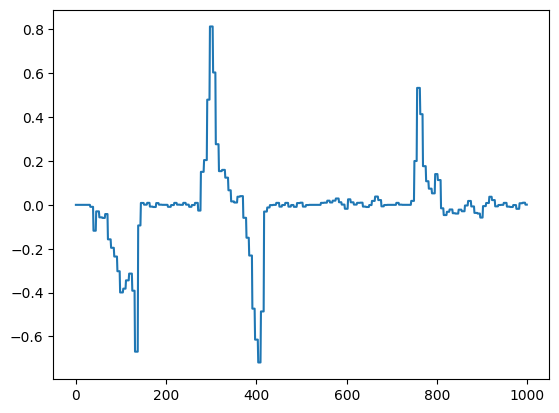

In [48]:
data = pd.read_csv('log/data_sensor_new.csv')
data['Velocity X [m/s]'].plot()